# Programming Coursework 2: K-Means Clustering

#### **Table of Contents**

1. **Section 1: Introduction**
  * Section 1.1: Outline, Assumptions
  * Section 1.2: Introduction to K-Means
  * Section 1.3: Psuedocode
  
  
2. **Section 2: Preparing the Dataset**
  * Section 2.1: Creating a small dataset


3. **Section 3: Applying K-Means on paper**
  * Section 3.1: Applying K-Means to a small dataset
  
  
4. **Section 4: Test Harness**
  * Section 4.1: What can be tested?
  * Section 4.2: Unit Testing or Implementation Testing?


5. **Section 5: Applying K-Means implementation on a large dataset**
  * Section 5.1: Assumptions to be made
  * Section 5.2: KMeansAlgorithm Class
  * Section 5.3: Generate Class
  * Section 5.4: Test Class
  * Section 5.5: Test Runs
      * Section 5.5.1: Test Run 1
      * Section 5.5.1: Test Run 2


5. **Section 6: Time / Space complexity and Conclusion**


## 1. Introduction

### 1.1. Outline, Assumptions
  
This document will be covering K-Means clustering. For the initial 'On Paper' stage, I will be using a dataset I have created, which shows 3 well defined clusters. For K-means to work accurately and reliably, some preliminary assumptions have to be made:
1. The number of K has to be pre-defined for K-Means to work.
2. The starting points should either be pre-determined or random, Starting points cannot overlap. i.e. you cannot start K-Mean Clustering with 3 initial starting points with the same co-ordinates, they must be different.
3. There isnt a significant amount of noise in the dataset, as it makes K-Means not work as well/ accurately.
4. We will need to assume a limit to the number of clusters created / used.
5. An assumption to be made is that for each centroid, at least 1 datapoint is initially allocated or found for each centroid in the dataset. such that centroids are representative of a cluster rather than a small off-chance that they never move. 

### 1.2. Introduction to K-Means Clustering

#### What is K-Means?
K-Means is an algorithm commonly used in machine learning to group a given dataset into clusters, helping identify subgroups and patterns within data. An example use-case scenario would be Species of animals, particularly cats for example. you can have a large dataset describing cats in various ways. In order to identify the species, K-Means can be deployed to identify patterns in the data where descriptions and features of particular cats seem to be similar. Each cluster could potentially help us identify a particular species of cats. 

#### How does it work?
K-Means is initiated with k, a pre-determined number of clusters to compute. The steps are as follows:
1. K number of clusters are inputted.
2. Each K value will be assigned a random co-ordinate and is plotted alongside the rest of the dataset, where k is a centroid. 
3. The distance of each datapoint from the each centroid will be calculated.
4. Now that we know the distance of each datapoint from the initial centroids, we allocate each datapoint to the nearest centroid. 
5. The mean of all datapoints within a each centroid allocation is calculated, treating x and y values respectively. e.g. We explicitly find the mean values of X followed by the mean values of Y.
6. We update the centroids' location with the mean of all datapoints within their group allocation. e.g. centroid 1 will be updated with mean of x and mean of y from all datapoints allocated to centroid 1.
6. This function is recursive, such that each time the centroid is updated with the mean(new location), the datapoints are re-assigned to the closest centroid.
7. The algorithm will stop when all centroids stop moving, which means the center of each cluster has been found, and all datapoints have been sorted into ther 'best' group / clusters.

The overall aim is for the centroids to find their way to the center of each cluster, and correctly group datapoints in accordance to their location.

### 1.3. Psuedocode

**below is a basic psuedocode summarising the process:**

Randomly choose k examples as initial centroids

While true:

    Create k clusters by assigning each example to closest centroid
    
    Compute k new centroids by averaging examples in each cluster
    
    If centroids don’t change:
        
         Break
         
Starting off with some imports for the libraries to be used:

In [1]:
#Essential imports to be used
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
%matplotlib inline

## 2. Preparing the dataset

### 2.1 Creating a small dataset

In this section, I have created a small dataset in which I can use to test a K-Means algorithm on Paper. I have used a blend of digital technology and On-Paper resources for this section.

The Digital version was created alongside On-Paper variations to sanity check my workings out. Starting off with the dataset I created:

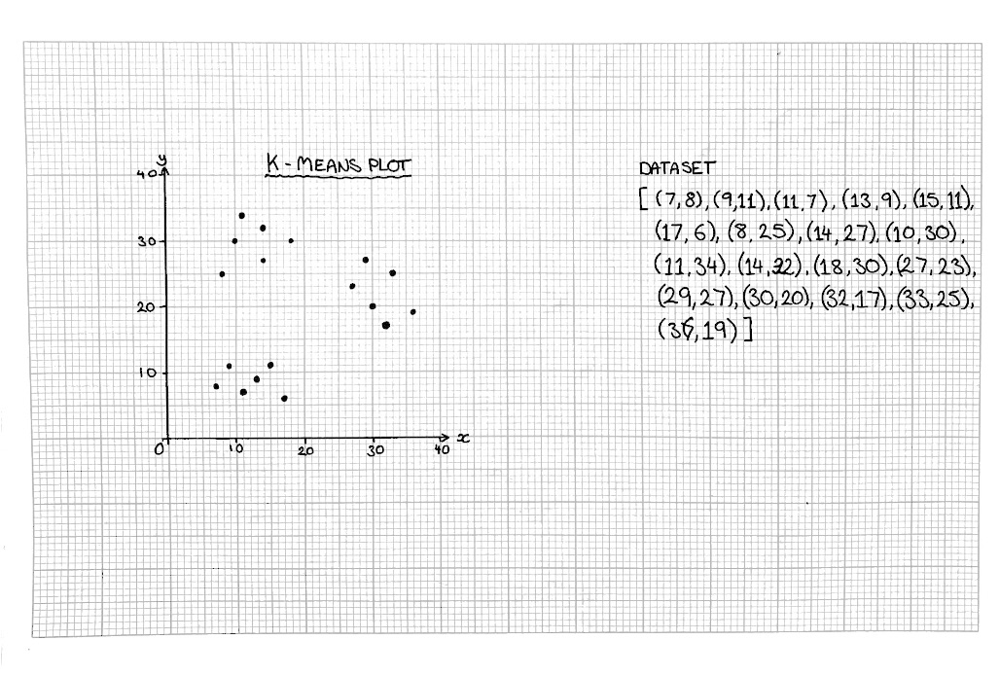

This dataset was created using graph paper. For testing purposes I created 3, well defined clusters to make it easy and keep track of my progress in K-Means. I allocated 6 datapoints to each cluster, and noted down the random points I selected on the graph which made up the dataset.

For better visualisation and double checking the correctness of my process, I also used the same dataset to plot a scatter graph on python for illustration purposes.

#### The result is as follows:

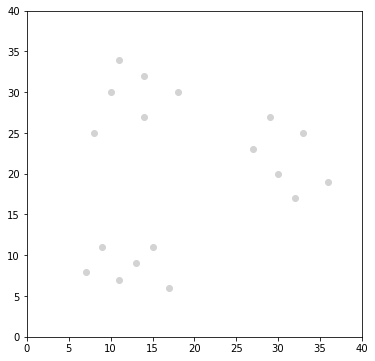

In [2]:
#creating a dataset comprising of X and y values
x_values = [7,9,11,13,15,17,8,14,10,11,14,18,27,29,30,32,33,36]
y_values = [8,11,7,9,11,6,25,27,30,34,32,30,23,27,20,17,25,19]

#zipping x and y values, attaching them tog
dataset = list(zip(x_values, y_values))

xs = [x[0] for x in dataset]
ys = [y[1] for y in dataset]

fig, ax = plt.subplots(figsize = (6,6))

#plotting the dataset
plt.scatter(xs, ys, color = 'lightgrey')

#setting x and y boundaries such that it matches my on-paper illustration
plt.xlim(0,40)
plt.ylim(0,40);

## 3. Applying K-Means on paper

### 3.1 Applying K-Means to a small dataset

In this section, I will be walking through the process I undertook to apply k-means to my dataset.

Going into this dataset we are going in with the assumptions that:
1. There are well defined clusters within the dataset
2. We are only looking to identify 3 clusters

Starting off the process, I Randomly selected 3 centroids to plot on the graph, which were as follows:

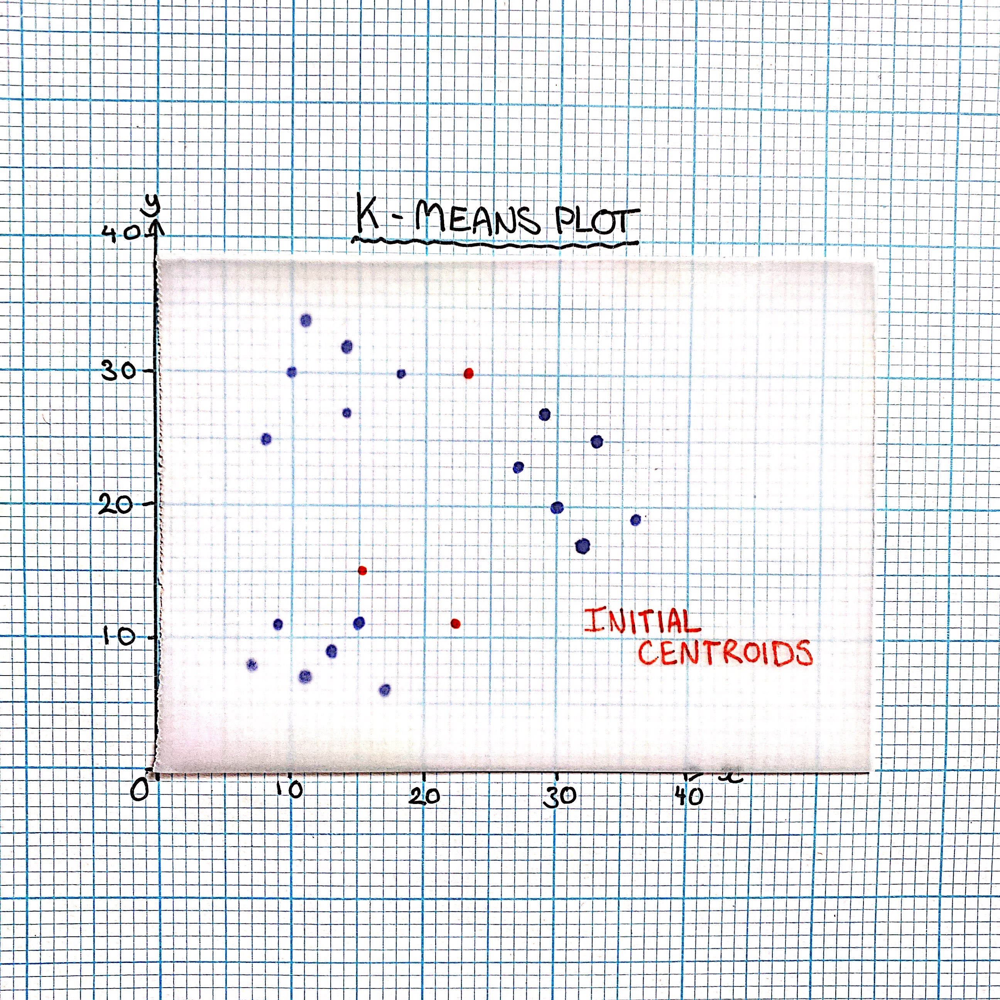

The 3 centroids are located as follows:
 - Centroid 1 = (15,15)
 - Centroid 2 = (22,11)
 - Centroid 3 = (23,30)

Below is the same output plotted via python scatter plot. Again, I am using python for better, clearer illustrations.

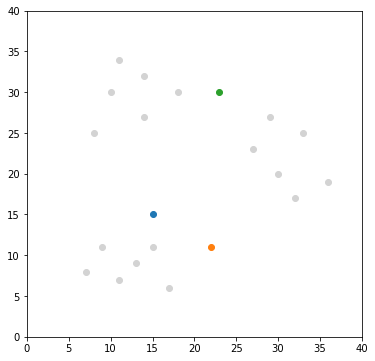

In [3]:
fig, ax = plt.subplots(figsize = (6,6))

#creating a colorpalette for later use, 3 colours for 3 clusters.
palette = ['skyblue', 'wheat', 'darkseagreen']

plt.scatter(x_values, y_values, color = 'lightgrey')

#plotting centroids onto the same scatter plot
centroid1 = plt.scatter(15,15)
centroid2 = plt.scatter(22,11)
centroid3 = plt.scatter(23,30)

plt.xlim(0,40)
plt.ylim(0,40);

### Calculating distance from Centroids

The distance between each datapoint and the 3 centroids was calculated via their Euclidean Disance, which is calculated using the following formula:

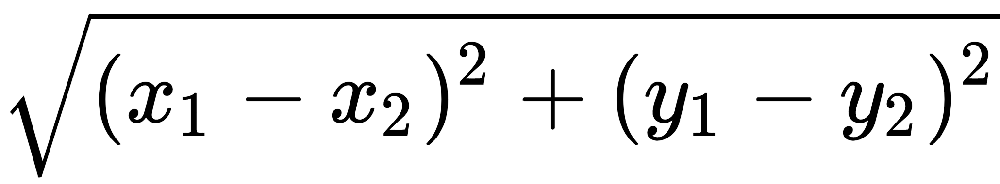

Essentially, it is calculated using: 
1. The difference between both the x and y co-ordinates respectively.
2. Those are put into brackets, and squared
3. After having been expanded and squared, the results of both differences are added up
4. lastly, they are square rooted.
    e.g. for dp1(7,8) against C1(15,15), I did the following:
     - For C1: sqrt((15 - 7) ** 2 + (15 - 8) ** 2) = 10.63
     - For C2: sqrt((22 - 7) ** 2 + (11 - 8) ** 2) = 15.3
     - For C3: sqrt((23 - 7) ** 2 + (30 - 8) ** 2) = 27.2

5. Using the Euclidean distance, we can now assign each datapoint to whichever centroid it is closest to, by taking the smallest value from the calculation. In the case of dp1, Centroid 1 (C1) seems to be closest.

##### Now that the centroids were plotted, I created a table in which I used to calculate the distance of each datapoint from the 3 centroids plotted. For abbreviation purposes. The 3 centroids are now identified as C1, C2, and C3. 

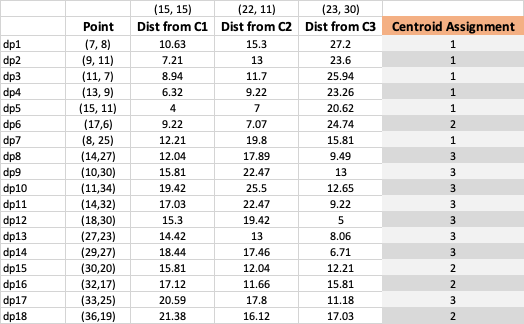

To ensure my calculations were correct, I used python to work out the differences for each datapoint from the centroids to make sure I noted the distances accurately.

In [4]:
# creating a counter
counter = 0

# for each x and y value in the dataset
for x, y in dataset:
    #basic calculations, with the second value being the x and y co-ordinates of the current centroid position.
    c1 = round(np.sqrt((x - 15) ** 2 + (y - 15) ** 2), 2)
    c2 = round(np.sqrt((x - 22) ** 2 + (y - 11) ** 2), 2)
    c3 = round(np.sqrt((x - 23) ** 2 + (y - 30) ** 2), 2)
    
    #counter used for printing the dp being worked on
    counter +=1
    
    # creating an output statement each time the loop is ran
    print(f'dp{counter} \t centroid 1 = {c1} \t centroid 2 = {c2} \t centroid 3 = {c3}')

dp1 	 centroid 1 = 10.63 	 centroid 2 = 15.3 	 centroid 3 = 27.2
dp2 	 centroid 1 = 7.21 	 centroid 2 = 13.0 	 centroid 3 = 23.6
dp3 	 centroid 1 = 8.94 	 centroid 2 = 11.7 	 centroid 3 = 25.94
dp4 	 centroid 1 = 6.32 	 centroid 2 = 9.22 	 centroid 3 = 23.26
dp5 	 centroid 1 = 4.0 	 centroid 2 = 7.0 	 centroid 3 = 20.62
dp6 	 centroid 1 = 9.22 	 centroid 2 = 7.07 	 centroid 3 = 24.74
dp7 	 centroid 1 = 12.21 	 centroid 2 = 19.8 	 centroid 3 = 15.81
dp8 	 centroid 1 = 12.04 	 centroid 2 = 17.89 	 centroid 3 = 9.49
dp9 	 centroid 1 = 15.81 	 centroid 2 = 22.47 	 centroid 3 = 13.0
dp10 	 centroid 1 = 19.42 	 centroid 2 = 25.5 	 centroid 3 = 12.65
dp11 	 centroid 1 = 17.03 	 centroid 2 = 22.47 	 centroid 3 = 9.22
dp12 	 centroid 1 = 15.3 	 centroid 2 = 19.42 	 centroid 3 = 5.0
dp13 	 centroid 1 = 14.42 	 centroid 2 = 13.0 	 centroid 3 = 8.06
dp14 	 centroid 1 = 18.44 	 centroid 2 = 17.46 	 centroid 3 = 6.71
dp15 	 centroid 1 = 15.81 	 centroid 2 = 12.04 	 centroid 3 = 12.21
dp16 	 centroid

These results match up with the calculations carried out in my table, so I know this now accurately tells me the results given the centroid locations and the dataset.

### Creating cluster groups based on Centroid Assignment
Now I will proceed with creating 3 lists, 1 for each centroid, and allocating the appropriate datapoints to them.

For each group, I did the following calculation to work out the mean (new centroid position):

1. Each group was organised into a list of co-ordinates depending on the Centroid Assignment.
2. For each list, I took all the x/ y co-ordinates to find the mean of x/ y co-ordinates respectively within that particular group. 

    For example, centroid 1 consisted of the following:
        - [(7, 8), (9, 11), (11, 7), (13, 9), (15, 11) (8, 25)], the following caluclation was made:
        
            - mean of x = Sum of x co-ordinates / number of x co-ordinates
            - mean of x = (7 + 9 + 11 + 13 + 15 + 8) / 5
            - mean of x = 10.5
            
            - mean of y = Sum of y co-ordinates / number of y co-ordinates
            - mean of y = (8 + 11 + 7 + 9 + 11 + 25) / 5
            - mean of y = 11.83
            
            
3. Now that we have the mean values for each group, we can proceed to plot the new centroid location as well as all the relevant assigned datapoints in the visualisation:

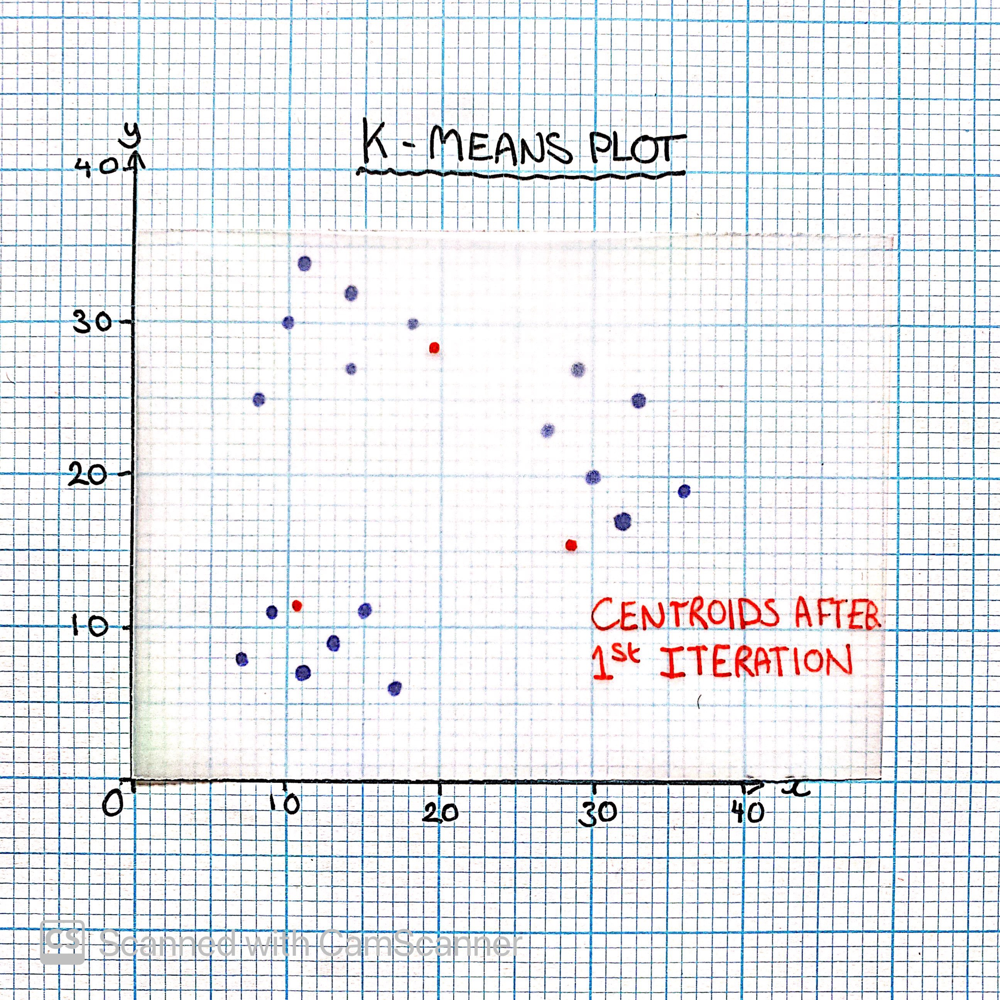

above is my illustration, below are my results:

Co-ordinates of Centroid 1 is: (10.5, 11.83)
Co-ordinates of Centroid 2 is: (28.75, 15.5)
Co-ordinates of Centroid 3 is: (19.5, 28.5)


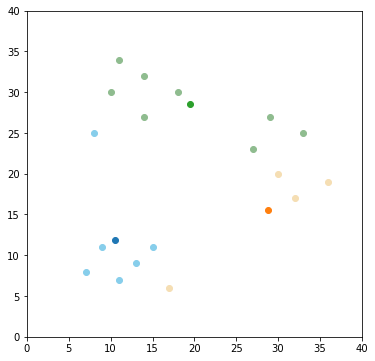

In [5]:
# grouping each cluster in accordance to centroid assignment
cluster1 = [(7, 8), (9, 11), (11, 7), (13, 9), (15, 11), (8, 25)]
cluster2 = [(17,6), (30,20), (32,17), (36,19)]
cluster3 = [(14,27), (10,30), (11,34), (14,32), (18,30), (27,23), (29,27), (33,25)]

fig, ax = plt.subplots(figsize = (6,6))

#putting the clusters into a list
clusters = [cluster1, cluster2, cluster3]

#resetting counter to 0
counter = 0

#for each cluster
for i in clusters:
    cx = [x[0] for x in i]    #get the x's and turn them into a list
    cy = [x[1] for x in i]    #get the y's and turn them into a list
    
    """""""""
    plot using values extracted, each time with different color 
    for each of the clusters, color controlled by palette 
    I created and counter to iterate through the colours.
    """""""""
    plt.scatter(cx, cy, color = palette[counter])   
    counter += 1
    
    #mean is calculated for each centroid
    mean_cx = round(sum(cx) / len(cx), 2)
    mean_cy = round(sum(cy) / len(cy), 2)
    
    #mean displayed
    print(f'Co-ordinates of Centroid {counter} is: ({mean_cx}, {mean_cy})')
    
    #centroid plotted
    plt.scatter(mean_cx,mean_cy)
    
plt.xlim(0,40)
plt.ylim(0,40);

#### So far, my calculations match up to the illustrations

The blue centroid seems a little high in the bottom left cluster, however, that seems to be because a point from the top cluster was assigned to it, over the next iteration I expect that point to be assigned to the green centroid. Orange seems to be in the same situation as it is a little low due to one of the points being located in the bottom cluster, which should hopefully be resolved in the next iteration. 

now proceeding with the next couple of steps, which basically repeat until no further centroid movement is observed. Below is the re-calculation of the Centroid Assignment using the new X and Y co-ordinates of the centroids:

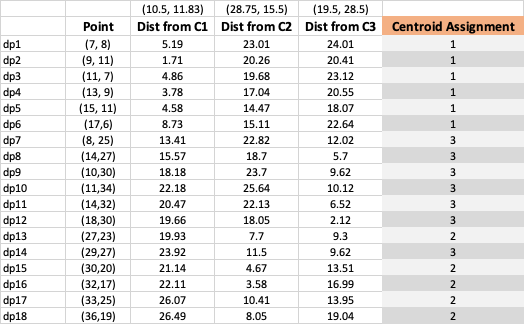

Again, python was used to double check my workings out:

In [6]:
# creating a counter
counter = 0

# for each x and y value in the dataset
for x, y in dataset:
    #basic calculations, with the second value being the x and y co-ordinates of the current centroid position.
    c1 = round(np.sqrt((x - 10.5) ** 2 + (y - 11.83) ** 2), 2)
    c2 = round(np.sqrt((x - 28.75) ** 2 + (y - 15.5) ** 2), 2)
    c3 = round(np.sqrt((x - 19.5) ** 2 + (y - 28.5) ** 2), 2)

    #counter used for printing the dp being worked on
    counter +=1
    
    # creating an output statement each time the loop is ran
    print(f'dp{counter} \t centroid 1 = {c1} \t centroid 2 = {c2} \t centroid 3 = {c3}')

dp1 	 centroid 1 = 5.19 	 centroid 2 = 23.01 	 centroid 3 = 24.01
dp2 	 centroid 1 = 1.71 	 centroid 2 = 20.26 	 centroid 3 = 20.41
dp3 	 centroid 1 = 4.86 	 centroid 2 = 19.68 	 centroid 3 = 23.12
dp4 	 centroid 1 = 3.78 	 centroid 2 = 17.04 	 centroid 3 = 20.55
dp5 	 centroid 1 = 4.58 	 centroid 2 = 14.47 	 centroid 3 = 18.07
dp6 	 centroid 1 = 8.73 	 centroid 2 = 15.11 	 centroid 3 = 22.64
dp7 	 centroid 1 = 13.41 	 centroid 2 = 22.82 	 centroid 3 = 12.02
dp8 	 centroid 1 = 15.57 	 centroid 2 = 18.7 	 centroid 3 = 5.7
dp9 	 centroid 1 = 18.18 	 centroid 2 = 23.7 	 centroid 3 = 9.62
dp10 	 centroid 1 = 22.18 	 centroid 2 = 25.64 	 centroid 3 = 10.12
dp11 	 centroid 1 = 20.47 	 centroid 2 = 22.13 	 centroid 3 = 6.52
dp12 	 centroid 1 = 19.66 	 centroid 2 = 18.05 	 centroid 3 = 2.12
dp13 	 centroid 1 = 19.93 	 centroid 2 = 7.7 	 centroid 3 = 9.3
dp14 	 centroid 1 = 23.92 	 centroid 2 = 11.5 	 centroid 3 = 9.62
dp15 	 centroid 1 = 21.14 	 centroid 2 = 4.67 	 centroid 3 = 13.51
dp16 	 ce

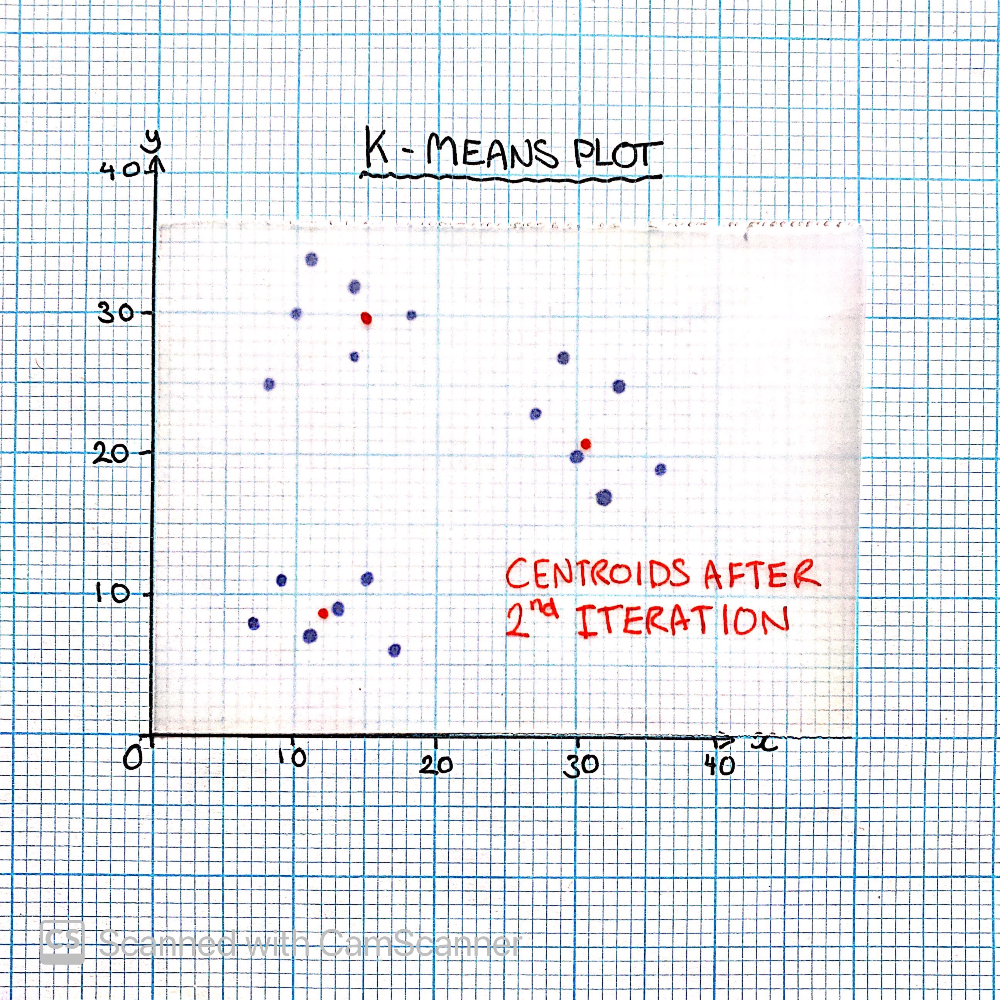

Above is a plot of my findings, below is my digital plot, with the new location of the centroids:

Co-ordinates of Centroid 1 is: (12.0, 8.67)
Co-ordinates of Centroid 2 is: (31.6, 20.8)
Co-ordinates of Centroid 3 is: (14.86, 29.29)


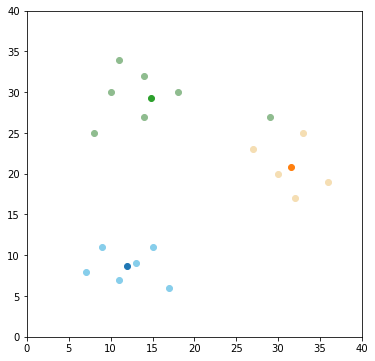

In [7]:
cluster1 = [(7,8), (9,11), (11,7), (13,9), (15,11), (17,6)]
cluster2 = [(30,20), (32,17), (33,25), (36,19), (27,23)]
cluster3 = [(8,25), (14,27), (10,30), (11,34), (14,32), (18,30), (29,27)]

fig, ax = plt.subplots(figsize = (6,6))

clusters = [cluster1, cluster2, cluster3]
counter = 0
for i in clusters:
    cx = [x[0] for x in i]
    cy = [x[1] for x in i]
    plt.scatter(cx, cy, color = palette[counter])
    counter += 1
    mean_cx = round(sum(cx) / len(cx), 2)
    mean_cy = round(sum(cy) / len(cy), 2)
    print(f'Co-ordinates of Centroid {counter} is: ({mean_cx}, {mean_cy})')
    
    plt.scatter(mean_cx,mean_cy)
    
plt.xlim(0,40)
plt.ylim(0,40);

We can tell that all 3 centroids have taken on a more appropriate location each iteration with the clustering / grouping becoming more accurate as we go along in the process. There is 1 more iteration to carry out from what I can tell from the illustration above. I think this because after the next iteration, the datapoints will all be organised in accordance to their nearest centroids and no further calculations are required. Centroids should not move after the next iteration, unless there is a problem with the algorithm created.

Again, the recursive function occurs, repeating the process. Below is the table I have created using the new centroid locations:

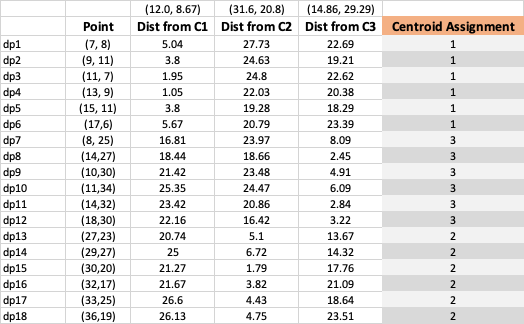

Below is my method of double checking whether my calculations are correct:

In [8]:
# creating a counter
counter = 0

# for each x and y value in the dataset
for x, y in dataset:
    #basic calculations, with the second value being the x and y co-ordinates of the current centroid position.
    c1 = round(np.sqrt((x - 12.0) ** 2 + (y - 8.67) ** 2), 2)
    c2 = round(np.sqrt((x - 31.6) ** 2 + (y - 20.8) ** 2), 2)
    c3 = round(np.sqrt((x - 14.86) ** 2 + (y - 29.29) ** 2), 2)

    #counter used for printing the dp being worked on
    counter +=1
    
    # creating an output statement each time the loop is ran
    print(f'dp{counter} \t centroid 1 = {c1} \t centroid 2 = {c2} \t centroid 3 = {c3}')

dp1 	 centroid 1 = 5.04 	 centroid 2 = 27.73 	 centroid 3 = 22.69
dp2 	 centroid 1 = 3.8 	 centroid 2 = 24.63 	 centroid 3 = 19.21
dp3 	 centroid 1 = 1.95 	 centroid 2 = 24.8 	 centroid 3 = 22.62
dp4 	 centroid 1 = 1.05 	 centroid 2 = 22.03 	 centroid 3 = 20.38
dp5 	 centroid 1 = 3.8 	 centroid 2 = 19.28 	 centroid 3 = 18.29
dp6 	 centroid 1 = 5.67 	 centroid 2 = 20.79 	 centroid 3 = 23.39
dp7 	 centroid 1 = 16.81 	 centroid 2 = 23.97 	 centroid 3 = 8.09
dp8 	 centroid 1 = 18.44 	 centroid 2 = 18.66 	 centroid 3 = 2.45
dp9 	 centroid 1 = 21.42 	 centroid 2 = 23.48 	 centroid 3 = 4.91
dp10 	 centroid 1 = 25.35 	 centroid 2 = 24.47 	 centroid 3 = 6.09
dp11 	 centroid 1 = 23.42 	 centroid 2 = 20.86 	 centroid 3 = 2.84
dp12 	 centroid 1 = 22.16 	 centroid 2 = 16.42 	 centroid 3 = 3.22
dp13 	 centroid 1 = 20.74 	 centroid 2 = 5.1 	 centroid 3 = 13.67
dp14 	 centroid 1 = 25.0 	 centroid 2 = 6.72 	 centroid 3 = 14.32
dp15 	 centroid 1 = 21.27 	 centroid 2 = 1.79 	 centroid 3 = 17.76
dp16 	 ce

All calculations seem to indicate the same result, below are the new locations of the Centroids using the new means of each groups:

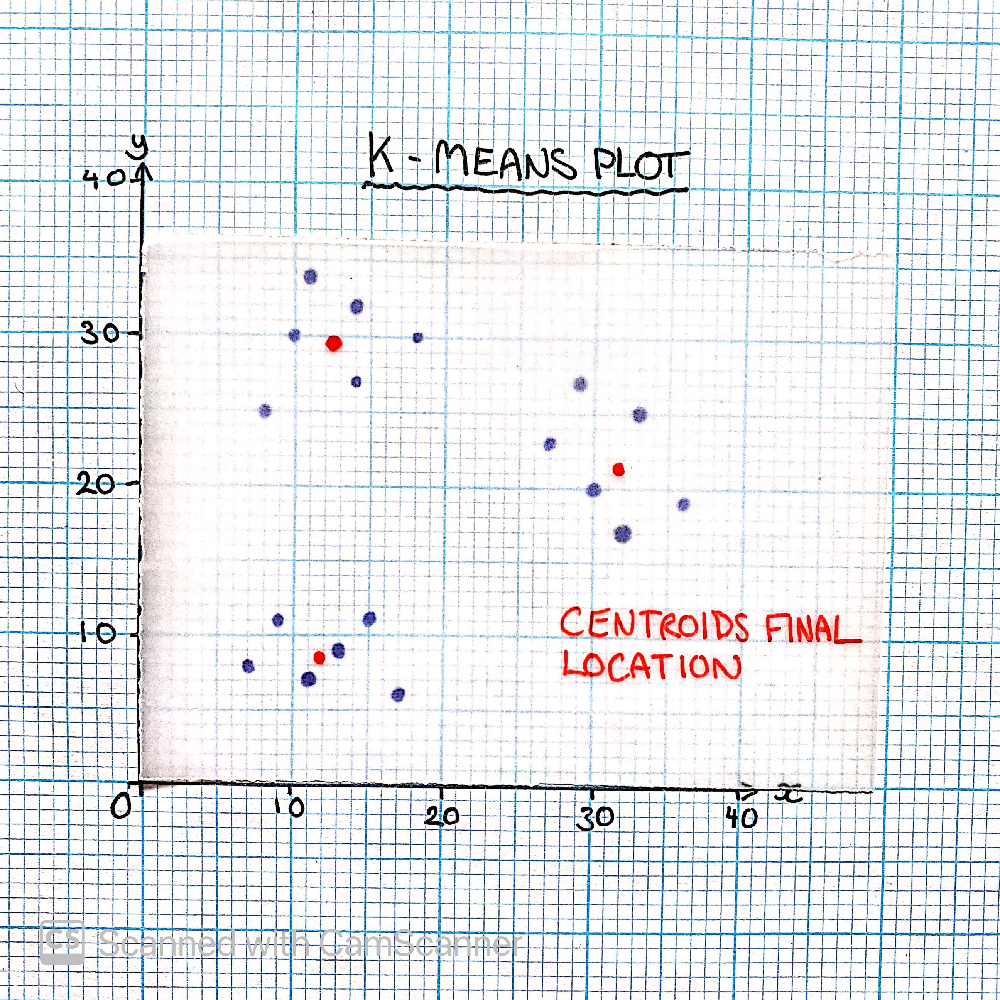

Below is the Python plot:

Co-ordinates of Centroid 1 is: (12.0, 8.67)
Co-ordinates of Centroid 2 is: (31.17, 21.83)
Co-ordinates of Centroid 3 is: (12.5, 29.67)


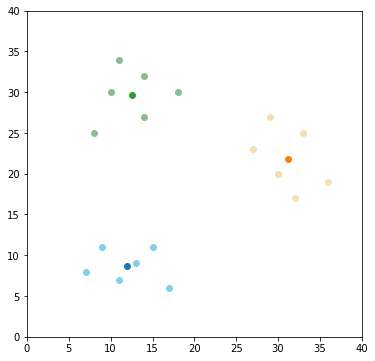

In [9]:
cluster1 = [(7,8), (9,11), (11,7), (13,9), (15,11), (17,6)]
cluster2 = [(27,23), (30,20), (32,17), (33,25), (36,19), (29,27)]
cluster3 = [(14,27), (10,30), (11,34), (14,32), (18,30), (8,25)]

fig, ax = plt.subplots(figsize = (6,6))

clusters = [cluster1, cluster2, cluster3]
counter = 0
for i in clusters:
    cx = [x[0] for x in i]
    cy = [x[1] for x in i]
    
    plt.scatter(cx, cy, color = palette[counter])
    counter += 1
    
    mean_cx = round(sum(cx) / len(cx), 2)
    mean_cy = round(sum(cy) / len(cy), 2)
    print(f'Co-ordinates of Centroid {counter} is: ({mean_cx}, {mean_cy})')
    plt.scatter(mean_cx,mean_cy)
    
plt.xlim(0,40)
plt.ylim(0,40);

#### What can we tell from this plot?

It is clear to see that the centroids are now central to each of their respective clusters. Which means that if we recur the process once more, there will be no changes. datapoints all seem to be in the right group, and the K-Means Clustering is complete!

#### Is this what I expected?
 - Going into this, I had in mind 3 clusters to be identified with 3 centroids.
 - Centroids always seemed to move in a direction towards the center of each cluster in the dataset.
 - Datapoints seemed to be correctly allocated to the centroids nearest to them.
 - The code was generally efficient at grouping by clusters, where centroids never made any unexpected moves.

## 4. Test Harness
### 4.1 What can be tested?
In this Section I will be explaining the basic tests to be run in this algorithm to ensure everything is running correctly.
I will be using Classes and Methods for this Algorithm, Such that minimal code is required to run the algorithm, and most the code can be hidden from the user (black box). The following will be tested:
 - The basic user input, Such as the number of k-clusters / k-centroids.
 - The x limit in which the data will be generated.
 - The y limit in which the data will be generated.
 - The final result will be compared against results from the SKLearn libraries to ensure it is correct.
 
As long as the code matches the output of KMeans from the SciKit learn libraries, it would be safe to assume that the core functionality of this algorithm was capable of producing accurate outputs.

### 4.2 Unit Testing or Implementation Testing?

A mixture of both Unit Testing and Implementation Testing will be used in this algorithm. an example of Implementation Testing would be things like the use of decorators or a dedicated functions to be used across the algorithm. Unit testing will mainly be used in the form of printing statements, such that a record is kept of the process. For example, printing the initial location of the centroid and the end location. Or when testing, printing a statement before testing is carried out and after to ensure no errors are raised. 

## 5. Applying K-Means implementation on a large dataset

Now that a test harness's parameters have been identified, I can move on to implementing K-Means on a larger scale.

### 5.1: Assumptions to be made

Below, I have created a randomised dataset with 4 clusters, the clusers are randomly generated with some noise.

With this dataset, we assume:
 - k clusters are to be identified by the algorithm, any k-value greater than 8 will not work in my program due to illustration purposes (not enough colours set up)
 
- The number of centroids created is **always** equivilant to the number of clusters created. This is the ideal scenario for testing purposes such that the algorithm can always work to idenfiy the best location for all centroids. Otherwise we would end up splitting clusters into further divisions which misrepresents the dataset. This may also require more computing power, thus taking up more time over more iterations to complete. 
 - Centroids are placed at random positions each time to ensure results are consistant.
 - Centroids are initialised such that no 2 centroids start in the same position, as this would cause issues.
 - Centroids pick up at least 1 datapoint each, which allows them to move. This is ensured in the code by explicitly making the centroids load in relatively close to at least 1 point in the dataset generated.

### 5.2: KMeansAlgorithm Class
Below is the main class we will be using, which is KMeansAlgorithm. This will contain all core functions of the program, such that when a dataset is provided, it can compute it.

In [59]:
#Essential imports to be used
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import datetime
%matplotlib inline
from IPython.display import clear_output

#KMeans Main Algorithm to be used
class KMeansAlgorithm:
    
    #Initialising all the self variables to be used
    def __init__(self, k, xlim, ylim):
        self.k = k
        self.xlim = xlim
        self.ylim = ylim
        
        #I do not need to do self.centroids = none, but to make it easier to see the list of self variables in the code, these were included.
        self.centroids = None
        self.skleanCentroids = None
        self.dataset = None
        self.clusterSet = None
        self.plotCount = 0

        #colours to be used for centroids and the data allocation for the visualisation.
        self.palette = {1: 'skyblue', 2: 'tan', 3: 'darkseagreen', 4: 'plum', 5: 'palegoldenrod', 6: 'lightcoral', 7: 'silver', 8: 'paleturquoise'}
        self.cpalette = {1: 'dodgerblue', 2: 'peru', 3: 'limegreen', 4: 'darkorchid', 5:'gold', 6: 'maroon', 7: 'dimgrey', 8: 'lightseagreen'}

        
    #Assigning Centroids method
    def assignCentroids(self):
        #For each key value in centroid, the Euclidean distance is calculated from that centroid at all datapoints
        for i in self.centroids.keys():
            self.dataset[f'DistanceFromC{i}'] = round(np.sqrt((self.dataset['X'] - self.centroids[i][0]) \
                                                              ** 2 + (self.dataset['Y'] - self.centroids[i][1]) ** 2), 2)
        
        '''''''''
        In this section, I am formatting the dataframe in pandas. Firstly I am adding a column of DistanceFromC1/2/3. 
        These will hold the distances of each datapoint from each of the centroids. I will then creating a new Closest
        column which works out the closest centroid based on the previous 3 columns created. This function is done in
        the second line, the 3rd line then formats this to display only a value of either 1, 2, 3 etc... corresplonding
        to the centroid assigned. lastly, Colour for a column of colours, used for visualisation of datapoint allocations.
        '''''''''
        centroidDistanceCol = ['DistanceFromC{}'.format(i) for i in self.centroids.keys()]
        self.dataset['Closest'] = self.dataset.loc[:, centroidDistanceCol].idxmin(axis=1)
        self.dataset['Closest'] = self.dataset['Closest'].map(lambda x: int(x.lstrip('DistanceFromC')))
        self.dataset['Colour'] = self.dataset['Closest'].map(lambda x: self.palette[x])
        
        #method returns dataset
        return self.dataset

    
    #print scatterplot to show progress method
    def printScatter(self, colourIn = 'lightgrey'):
        
        #Firstly, I create a labels tuple
        labels = []
        
        #Configuring dimensions of plot
        fig, ax = plt.subplots(figsize = (12,10))
        
        #Plotting scatter plot, if colour not passed in to the method, an assumed 'lightgrey' colour will be applied to datapoints plotted
        plt.scatter(self.dataset['X'], self.dataset['Y'], s = 20, color = colourIn)
        
        '''''''''
        Now for plotting centroiids, firstly I create a counter variable set to 0, counter does not use self, as I want the counter to be reset,
        I use the counter to create labels, then I assign the labels over a group, since it is a 0 based index, counter - 1 is used. S for scale 
        of dots.
        '''''''''
        counter = 0
        for i in self.centroids.keys():
            counter += 1
            labels.append(f'Cluster {counter}')
            plt.scatter(*self.centroids[i], color= self.cpalette[i], label = labels[counter - 1], s = 100)
           
        plt.title(f'Scatter plot after iteration {self.plotCount}', fontsize = 20)
        plt.legend();    #plotting title and legend

        
    #Creating a new method for updating centroids
    def updateCentroids(self):
        
        #over a loop, where i is the counter, update the centroids with the mean of points where points used are points allocated
        for i in self.centroids.keys():
            self.centroids[i][0] = np.mean(self.dataset[self.dataset['Closest'] == i]['X'])
            self.centroids[i][1] = np.mean(self.dataset[self.dataset['Closest'] == i]['Y'])
 

    def pContext(func):
        def printContext(self):
            print('------------\nInputs\n------------')
            print('K: ' + str(self.k))
            print('xlim: ' + str(self.xlim))
            print('ylim: ' + str(self.ylim))
            print('')
            return func(self)
        return printContext
        
        
    def measureTime(func):
        def measurementImp(*args, **kwargs):
            before = datetime.datetime.now()
            returnValue = func(*args, **kwargs)
            after = datetime.datetime.now()
            print('Execution time: ' + str(after - before))
            return returnValue
        return measurementImp
    
    
    @pContext
    @measureTime
    
    
    #Computing KMeans method. This is the main method for the script.
    def computeKMeans(self):
        '''''''''
        While true:
             - closest centroid variable created which contains dataset column Closest
             - centroids are updated, then assigned new locations
             - each iteration will create a new list of centroid values, which is used later for validation against
               sklearn libraries.
             - the next part is for when particular centroids are generated in an area such that they are not closer to
               any datapoints than other centroids, and are lost in the process. To prevent this, I have created some code to
               detect whether centroids are given NaN values after the first iteration, which means they are obselete due to their location,
               thus the process is started again and new centroids are created. This is a recursive function which occurs until appropriate 
               locations are allocated to the initial centroids.
             - if closestCentroids equal dataset(closest), meaning no datapoints have moved have been reallocated to a closer centroid, I
               assume that the mean of the centroids will no longer change at that pont. I print a final illustration of what the result
               for the algorithm looks like, followed by a statement showing the final locations of the centroids and end the while loop.
               a final statement is printed showing the number of iterations taken to complete the loop.
        '''''''''
        self.plotCount = 0
        Generate.randomCentroids(self)
        #printing scatter preview, no colour passed so grey dataset with centroids
        KMeansAlgorithm.printScatter(self)
        self.dataset = KMeansAlgorithm.assignCentroids(self)  
        
        #c variable assigned dataset Colour column for selecting colours
        c = self.dataset['Colour']
        
        while True:
            closestCentroids = self.dataset['Closest']
            KMeansAlgorithm.updateCentroids(self)
            KMeansAlgorithm.assignCentroids(self)
            self.centroidsList = list(self.centroids.values())
            
            if np.isnan(np.sum(self.centroidsList)) == True:
                clear_output(True)
                KMeansAlgorithm.computeKMeans(self)

            #plotCount used when plotting the scatterplots for title, indicating iteration number.
            self.plotCount += 1 
            KMeansAlgorithm.printScatter(self, c)

            
            if closestCentroids.equals(self.dataset['Closest']):
                print('')
                counter = 0
                for i in range(self.k):
                    counter +=1
                    print(f'Centroid {counter} final location: {np.round(self.centroids[counter], 2)}')
                    if i == self.k - 1:
                        print(f'\n\nAlgorithm completed in {self.plotCount} iterations')
                break

### 5.3 Generate Class (Generating data and centroid locations)
Below is the Generate class, which handles all code in relation to generating centroids and datasets. This class is used only at the start of the program to initialise centroids and a base dataset depending on the users choice of K, x limit and y limit, where data would be generated within the range inputted.

In [60]:
#Generate class - generating dataset and centroid locations in this class, inherits attributes from KMeansAlgorithm
class Generate(KMeansAlgorithm):
    
    #initiating class with attributes from KMeansAlgorithm
    def __init__(self, k, xlim, ylim):
        KMeansAlgorithm.__init__(self, k, xlim, ylim)
    
    
#generating a dataset through dataset() method, only arguement required is object.    
    def dataset(self):
        #clusterSet initialised
        clusterSet = None
        
        #for range in k, create a cluster
        for i in range(0,self.k):
            clusterCenter = [random.randint(0,self.xlim),random.randint(0,self.ylim)]
            cluster = np.random.randn(150, 2) + clusterCenter
            
            #if clusterSet hasnt got any values in it, feed in first cluster generated
            if clusterSet is None:
                clusterSet = cluster
                
            #else, concatinate clusters. I found this way to be the only working way for creating a clusterset
            #where there is no need to reformat the array.
            else:        
                clusterSet = np.concatenate((clusterSet, cluster))

        # stripping x and y values appart in clusterSet
        xs = [x[0] for x in clusterSet]
        ys = [y[1] for y in clusterSet]
        
        #creating a dataframe with 2 columns, for x and y values respectively
        dataset = pd.DataFrame(list(zip(xs, ys)), columns=['X', 'Y'])
        
        #rounding clustersets and creating new attributes for each
        self.clusterSet = clusterSet.round(2) 
        self.dataset = dataset.round(2)
    
    
    #generating random centroids
    def randomCentroids(self):
        
        #number of centroids always equal to number of clusters, thus uses self.k for number of clusters
        print(f'A total of {self.k} centroids initialised\n')
        
        #centroids dict created and counter initialised with 0
        centroids = {}
        counter = 0
        
        #for i in k number of clusters, create a centroid and update the centroids dict, print the centroids generated
        for i in range(self.k):
            counter +=1
            c = {counter : [np.random.randint(0, self.xlim), np.random.randint(0, self.ylim)]}
            centroids.update(c)
            print(f'Centroid {counter} created at {c[counter]}')
        
        #initialising attribute centroids with centroids co-ordinates
        self.centroids = centroids

Below is the test class, which handles all the error detection and validation against SKlean libraries to ensure appropriate calculations are carried out. This is carried out at the end to make sure everything was implemented correctly.

### 5.4 Class: Test (Handles all error checking procedures)

In [61]:
#importing KMeans from sklearn for validation purposes
from sklearn.cluster import KMeans

#new class test, inheriting from Generate class
class Test(Generate):
    
    #initialising Test class with Generate Attributes
    def __init__(self, k, xlim, ylim):
        Generate.__init__(self, k, xlim, ylim)
    
    #general testing in the algorithm
    def algorithm(self):
        '''''''''
        Print methods used at the beginning and end of this method, This visualises the error checking process for the user,
        as long as both messages are printed on the console, it means that no errors were raised during the testing process, 
        it is an extra way of ensuring that firstly, the assert functions are run. Secondly, there were no errors raised in
        the process.
        '''''''''
        
        #Using sklearn libraries to compute KMeans
        kmeans = KMeans(n_clusters = self.k)
        kmeans.fit(self.clusterSet)
        self.sklearnCentroids = kmeans.cluster_centers_
        
        #First test print
        print('\n\nTesting...')
        
        #Ensuring our centroids match the ones calculated by sklearn libraries
        assert self.sklearnCentroids.sort() == self.centroidsList.sort(), 'Error: Calculation of centroids do not match \
        that of SKLearn libraries result, some degree of inaccuracy present.'
        
        #Ensuring the number of labels passed in is the same number passed into sklearn
        assert len(list(set(kmeans.labels_))) == self.k, 'Error: Number of Clusters does not match that used in sklearn'
        
        #Ensuring the centroids have the same shape / layout
        np.testing.assert_equal(self.k, kmeans.cluster_centers_.shape[0])
        
        #Ensuring valid inputs are chosen for an appropriate result
        assert (self.k > 0) == True, 'Error: K value must be greater than 0.'
        assert (self.xlim > 2) == True, 'Error: xlim value must be at least 3.'
        assert (self.ylim > 2) == True, 'Error: ylim value must be at least 3.'
        
        #Final print statement reassuring user of a functional KMeans algorithm
        print('\nAll good, no errors present.')

### 5.5 Test Runs
#### 5.5.1 Test Run 1
This test run will test the basic functionality of the program, ensuring that the program correctly identifies the K, xlim and ylim inputted and calculates KMeans Appropriately.

In [62]:
# where KMeansAlgorithm(K(number of clusters / centroids), xlim(x axis limit), ylim(y axis limit))
trial1 = KMeansAlgorithm(3, 8, 8)  

#Generate dataset for Object created, this is sepeare to computing the algorithm to maintain a dataset.
Generate.dataset(trial1)

#Dataset created by Generate.dataset() displayed.
trial1.dataset                                    

,X,Y
0,8.39,3.70
1,6.24,3.33
2,7.64,3.37
3,6.37,3.07
4,5.81,2.46
...,...,...
445,6.64,1.66
446,6.60,2.99
447,7.33,1.18
448,8.80,-0.28


------------
Inputs
------------
K: 3
xlim: 8
ylim: 8

A total of 3 centroids initialised

Centroid 1 created at [4, 5]
Centroid 2 created at [2, 0]
Centroid 3 created at [5, 6]

Centroid 1 final location: [7.08 0.74]
Centroid 2 final location: [0.98 3.05]
Centroid 3 final location: [7.03 3.02]


Algorithm completed in 8 iterations
Execution time: 0:00:00.357210


Testing...

All good, no errors present.


,X,Y,DistanceFromC1,DistanceFromC2,DistanceFromC3,Closest,Colour
0,8.39,3.70,3.23,7.44,1.52,3,darkseagreen
1,6.24,3.33,2.72,5.27,0.85,3,darkseagreen
2,7.64,3.37,2.69,6.67,0.70,3,darkseagreen
3,6.37,3.07,2.44,5.39,0.66,3,darkseagreen
4,5.81,2.46,2.14,4.87,1.34,3,darkseagreen
...,...,...,...,...,...,...,...
445,6.64,1.66,1.02,5.83,1.42,1,skyblue
446,6.60,2.99,2.30,5.62,0.43,3,darkseagreen
447,7.33,1.18,0.50,6.62,1.86,1,skyblue
448,8.80,-0.28,2.00,8.50,3.74,1,skyblue


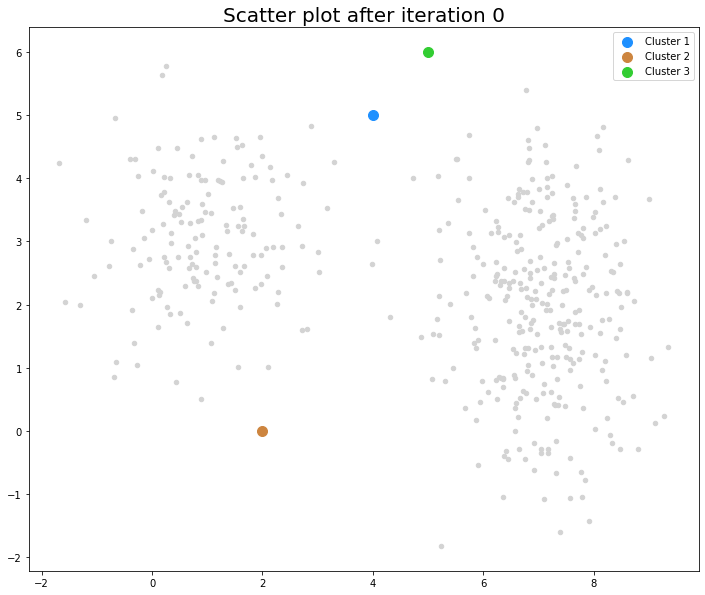

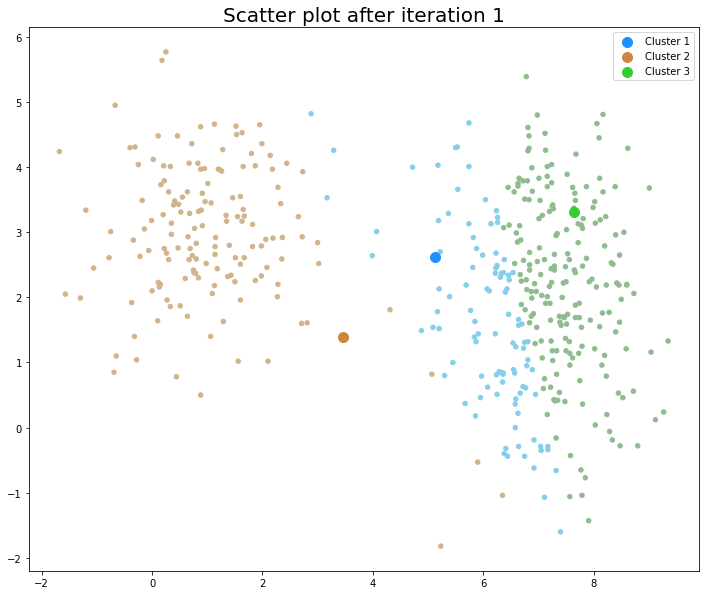

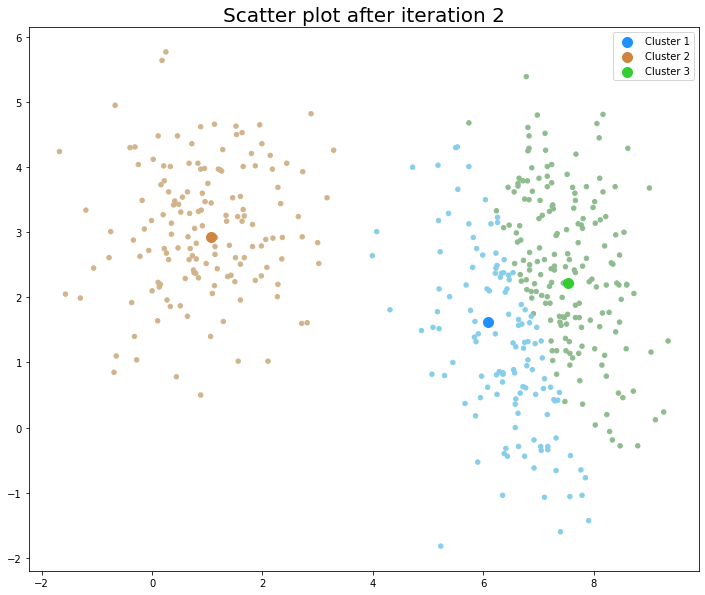

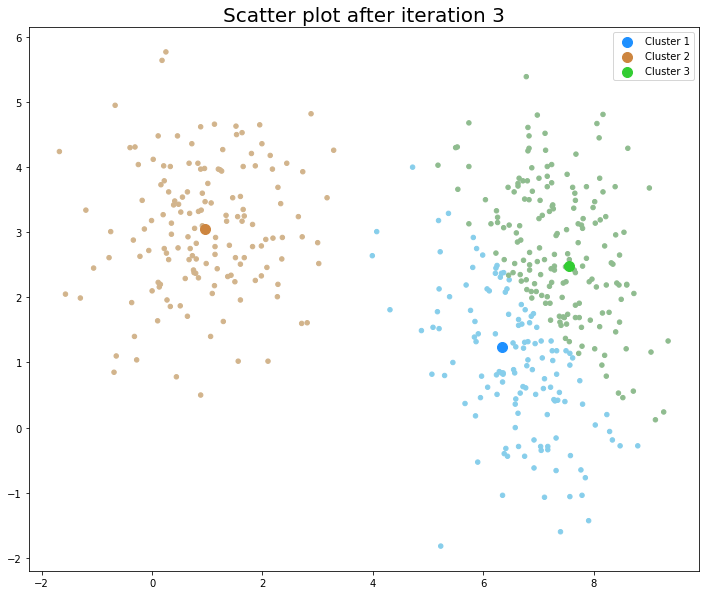

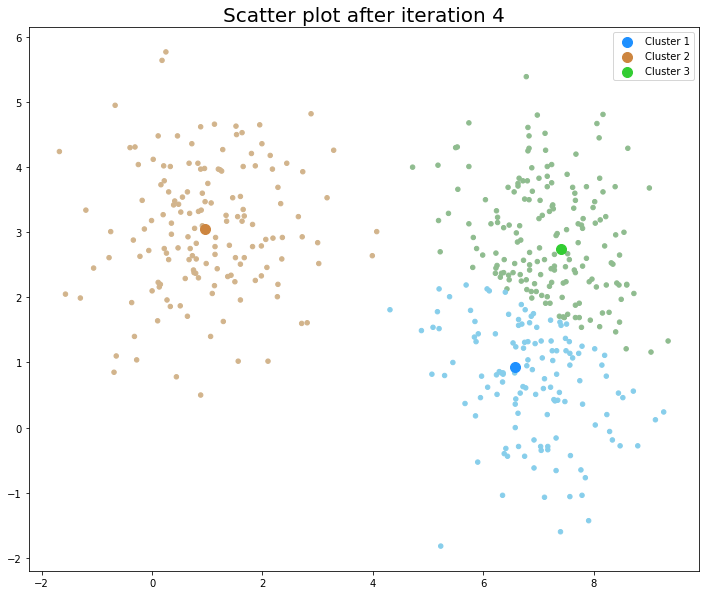

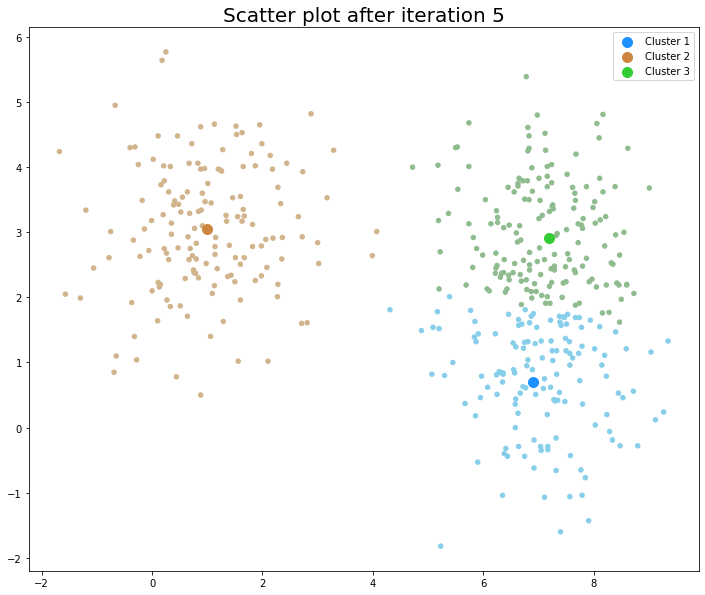

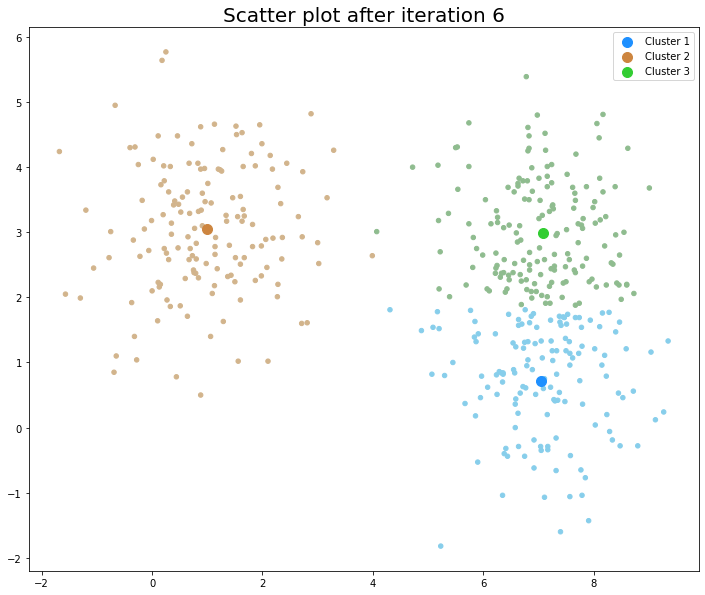

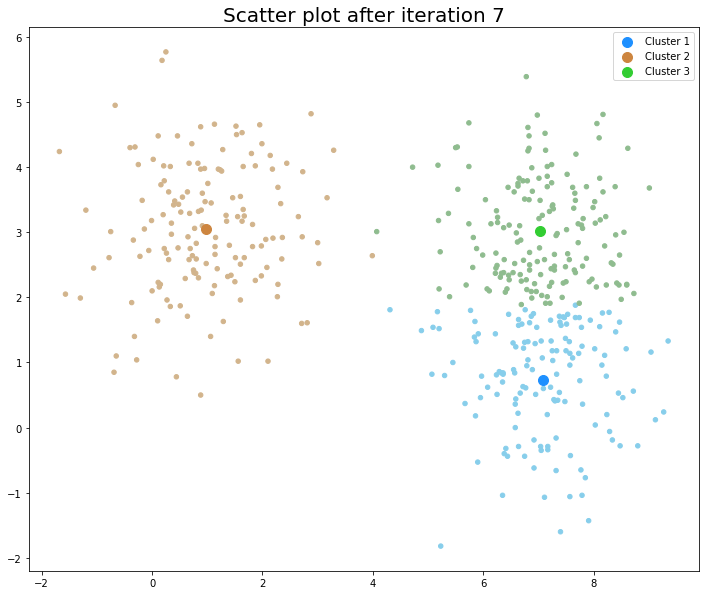

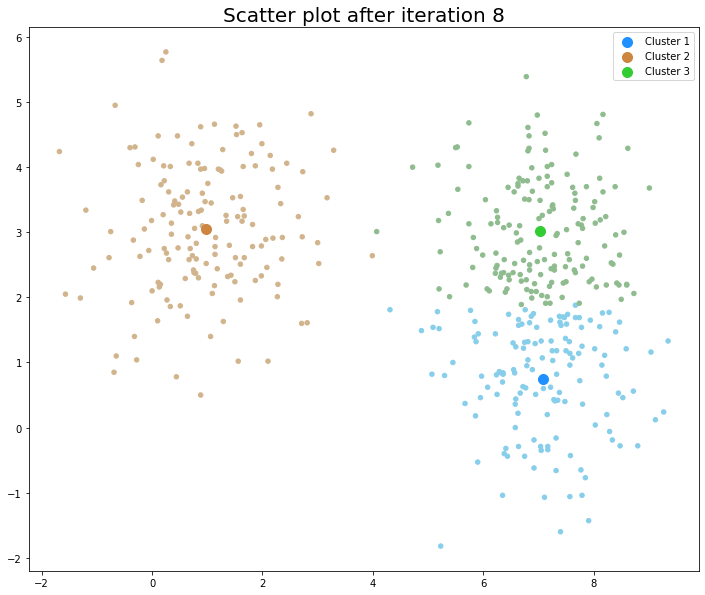

In [63]:
#Using main class to compute KMeans on trial object, which already holds a dataset, x and y limits as well as information on number of k.
KMeansAlgorithm.computeKMeans(trial1)

#Testing the algorithm to check the outputs.
Test.algorithm(trial1)

#printing the final dataset, to show what the final outcome is, also a way of visually checking whether algorithm is working correctly or not.
trial1.dataset

### 5.5.2 Test run 2: Using a different objects / Further testing

In this section, I will be calculating KMeans using the same algorithm, on the same instance. This will mainly be testing 2 things:

1. Whether my implementation of OOP is correct, I.E. when creating a new object, it does not store the same attributes as trial 1, unless programmed otherwise.
2. Centroid alloction. I implemented a function in my code such that if a centroid was generated too far away from all datapoints, new centroids will be generated and the algorithm starts over. This will be tested in this section.

In [64]:
# where KMeansAlgorithm(K(number of clusters / centroids), xlim(x axis limit), ylim(y axis limit))
trial2 = KMeansAlgorithm(4, 12, 12)  

#Generate dataset for Object created, this is sepeare to computing the algorithm to maintain a dataset.
Generate.dataset(trial2)

#Dataset created by Generate.dataset() displayed.
trial2.dataset

,X,Y
0,7.06,8.80
1,6.97,7.13
2,6.45,9.78
3,7.59,8.37
4,5.95,8.78
...,...,...
595,6.40,4.72
596,7.53,4.92
597,7.66,6.55
598,7.61,6.36


------------
Inputs
------------
K: 4
xlim: 12
ylim: 12

A total of 4 centroids initialised

Centroid 1 created at [9, 11]
Centroid 2 created at [11, 6]
Centroid 3 created at [4, 5]
Centroid 4 created at [5, 9]

Centroid 1 final location: [7.3  9.32]
Centroid 2 final location: [6.96 6.18]
Centroid 3 final location: [6.   1.11]
Centroid 4 final location: [5.49 9.9 ]


Algorithm completed in 16 iterations
Execution time: 0:00:00.560809

Centroid 1 final location: [7.3  9.32]
Centroid 2 final location: [6.96 6.18]
Centroid 3 final location: [6.   1.11]
Centroid 4 final location: [5.49 9.9 ]


Algorithm completed in 18 iterations
Execution time: 0:00:00.675640


Testing...

All good, no errors present.


,X,Y,DistanceFromC1,DistanceFromC2,DistanceFromC3,DistanceFromC4,Closest,Colour
0,7.06,8.80,0.58,2.62,7.76,1.92,1,skyblue
1,6.97,7.13,2.22,0.95,6.09,3.14,2,tan
2,6.45,9.78,0.97,3.64,8.68,0.96,4,plum
3,7.59,8.37,1.00,2.28,7.43,2.60,1,skyblue
4,5.95,8.78,1.46,2.79,7.67,1.21,4,plum
...,...,...,...,...,...,...,...,...
595,6.40,4.72,4.69,1.56,3.63,5.26,2,tan
596,7.53,4.92,4.41,1.38,4.10,5.38,2,tan
597,7.66,6.55,2.80,0.80,5.68,3.99,2,tan
598,7.61,6.36,2.98,0.68,5.49,4.13,2,tan


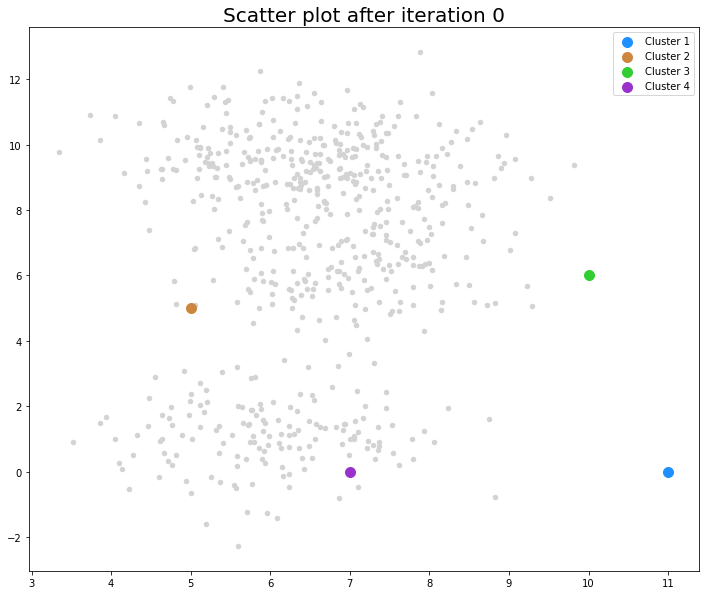

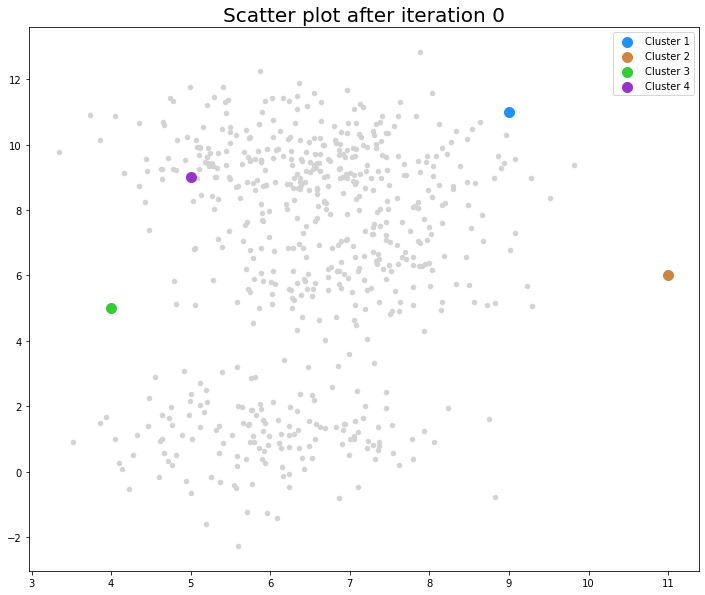

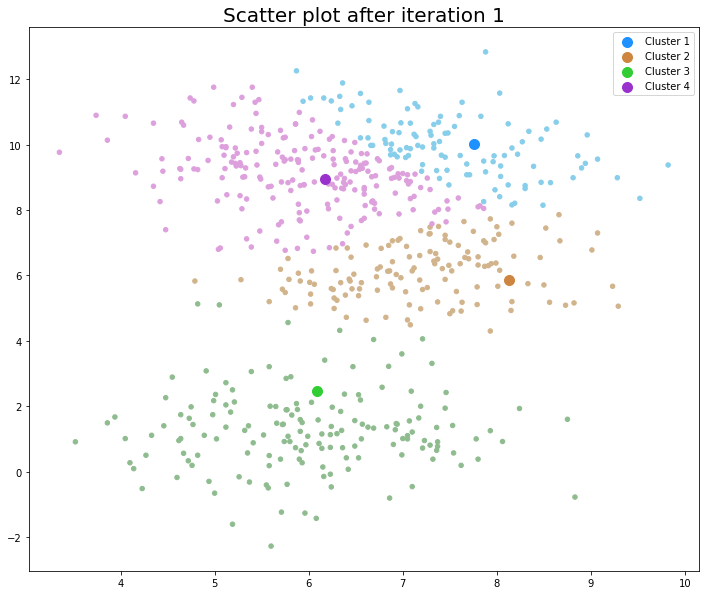

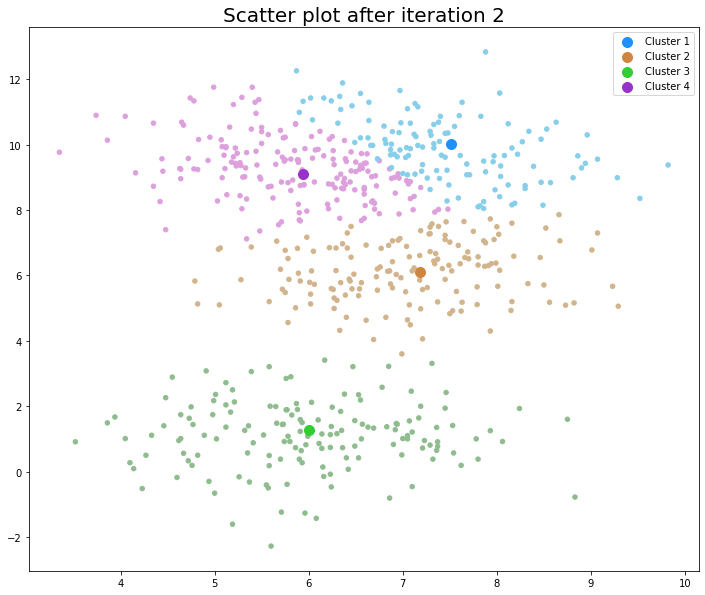

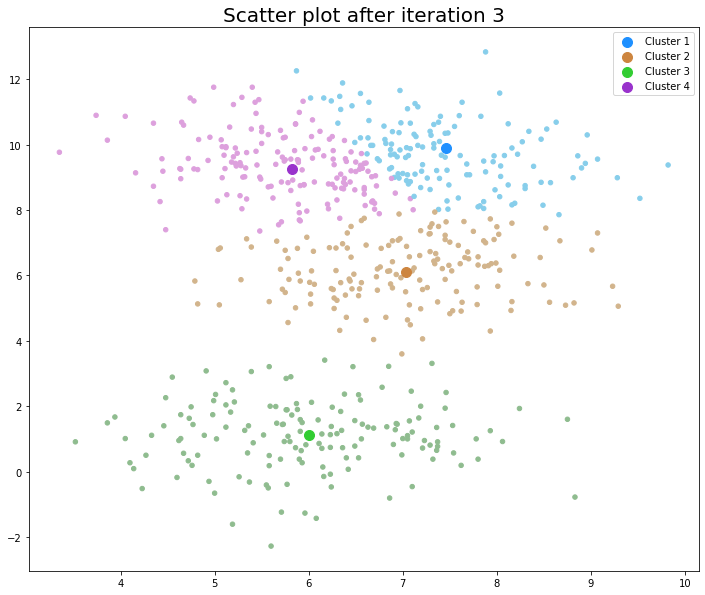

...

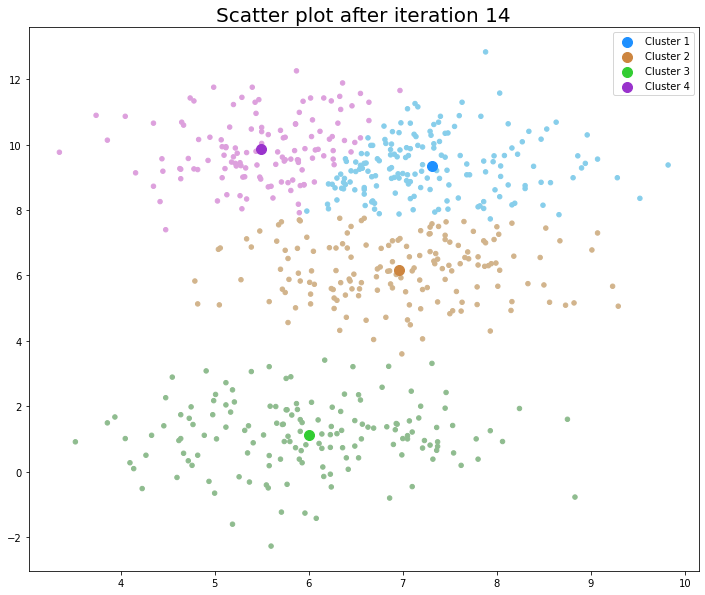

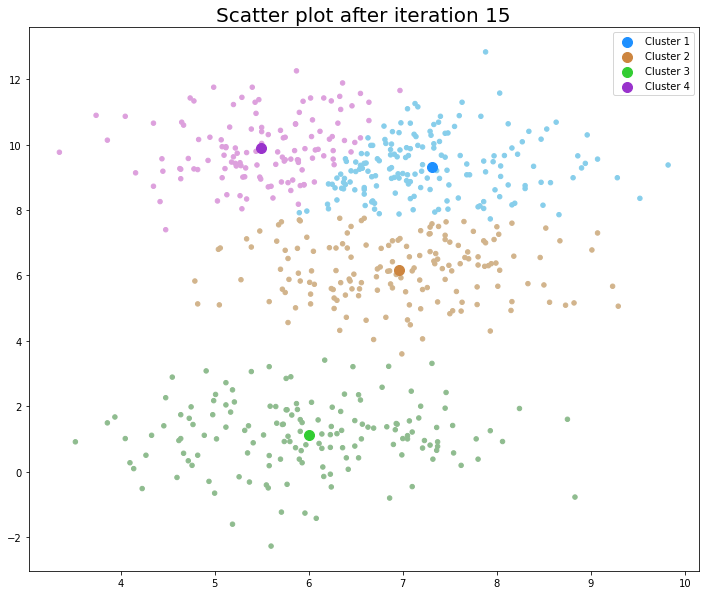

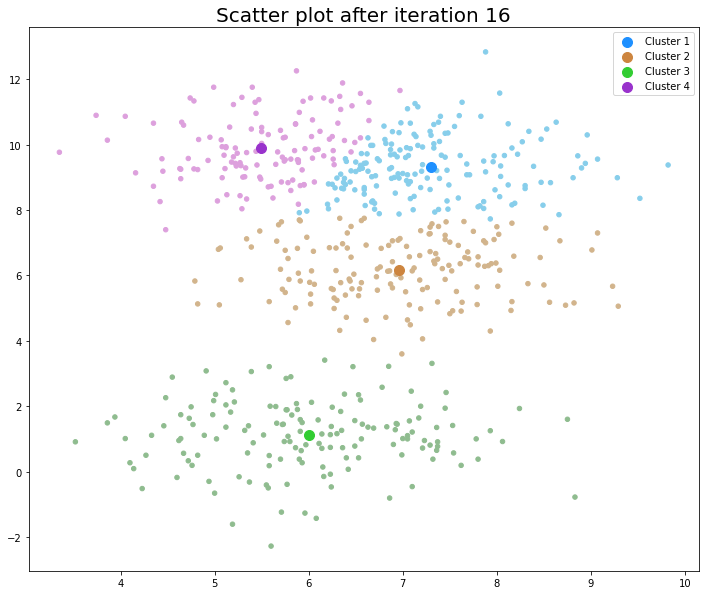

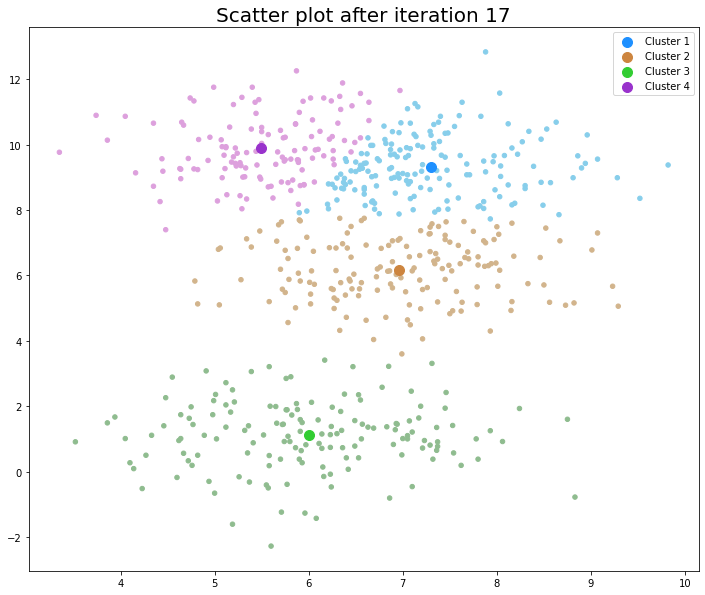

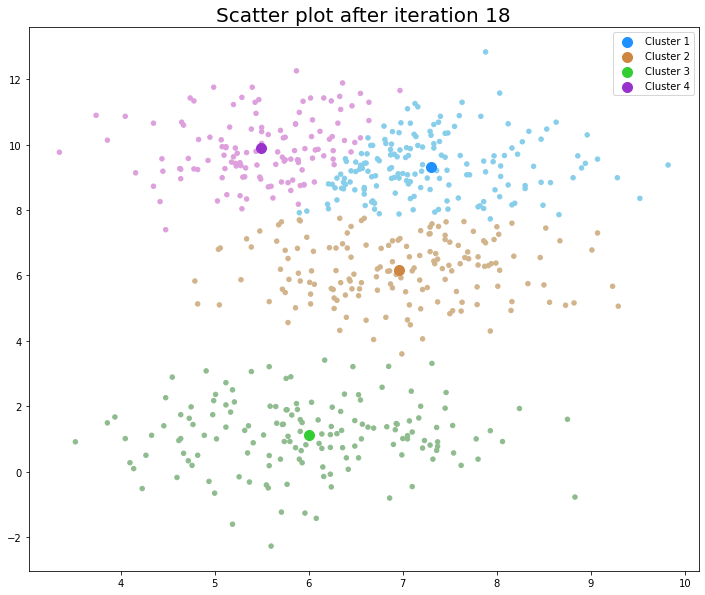

In [65]:
#Using main class to compute KMeans on trial object, which already holds a dataset, x and y limits as well as information on number of k.
KMeansAlgorithm.computeKMeans(trial2)

#Testing the algorithm to check the outputs.
Test.algorithm(trial2)

#printing the final dataset, to show what the final outcome is, also a way of visually checking whether algorithm is working correctly or not.
trial2.dataset

## 6. Time / Space Complexity and Conclusion

Firstly focusing on time complexity, I believe my algorithm, in relation to the big O notation, performs at O(n) time complexity. This is because during execution of code, there is no use of nested loops. i.e. in computeKMeans(), there are no loops found inside loops. I have generally avoided this by using if statements. There are also no 'else' statements present which can cause performance to deteriorate exponentially as data input is increased. This means that my Algorithm is capable of computing KMeans with **linear** performance rather than exponential, which is good. 

In relation to space, as long as no visualisation is required, this time complexity will remain the same. However, if taking into account the generation of visualisations at each stage of the process, especially when dealing with larger datasets, could slow down a system. Depending on system memory, I would recommend not printing scatter plots at each stage to show visualisation as this could take up a lot of memory, especially when plotting thousands of points on a graph, which could lead to worse time complexity (exponential or worse). 

Of course, there is some variation in performance of KMeans, which depends on 4 main factors:
 - Size of the dataset
 - Number of Centroids generated
 - Number of Clusters to be found
 - Location of the initial centroids
 
When playing around with the model, I noticed some variation in the outputs, depending on the size of the dataset and where centroids are located, some calculations were taking up to 40 iterations to complete so though the model may work at a linear timescale, this could almost be subjective to the run being performed. This is why we have other measures to take into consideration, such as **Big Omega** and **Theta time** to consider too.

exponential time complexity (O(n ** 2)),  May be seen in the when generating datasets, however, no-where else when running the code. This is because it uses Else statements.

In conclusion, I feel as though my KMeans Clustering algorithm performs relatively well and does so fairly efficiently. 


### Declaration

The main source I used for this assignment was https://benalexkeen.com/k-means-clustering-in-python/ . However, code was heavily adapted to make it more suited for this assignment submission. However, most inspiration and key concepts came from this source. 